# **CS579 - Online Social Network Analysis - Project 01**

### Group Members:
1. Dhruv Singh - A20541901
2. Kunal Nilesh Samant - A20541900

### Importing and Cleaning the data scrapped from Rotten Tomatoes

In [ ]:
import pandas as pd
import glob

# Specify the path pattern for your CSV files
csv_files = glob.glob('/content/data/*.csv')

# Initialize an empty list to store DataFrames
dfs = []

# Read each CSV file into a DataFrame and append to the list
for csv_file in csv_files:
    df = pd.read_csv(csv_file)
    dfs.append(df)

# Concatenate all DataFrames in the list along the rows (axis=0)
combined_df = pd.concat(dfs, ignore_index=True)

# Display the combined DataFrame
#print("Combined DataFrame:")
#print(combined_df)

# Example: Remove specific columns
columns_to_remove = ['aspect ratio','cast', 'director', 'distributor','producer', 'production co', 'release date (dvd)', 'release date (streaming)', 'rerelease date (theaters)', 'sound mix', 'url', 'view the collection', 'writer', 'synopsis', 'rating']
combined_df = combined_df.drop(columns=columns_to_remove)


combined_df = combined_df.dropna()

# Remove duplicates based on specific columns
df_no_duplicates = combined_df.drop_duplicates(subset=['title'])

# Display the cleaned DataFrame
print("\nCleaned DataFrame:")
print(combined_df)

# Save the combined DataFrame to a new CSV file
combined_file_path = 'combined_file.csv'
combined_df.to_csv(combined_file_path, index=False)
print("File Combined")



Cleaned DataFrame:
     audience score box office (gross usa)  \
2              73.0                 $24.0K   
3              57.0                $945.9K   
14             43.0                  $6.6M   
15            100.0                 $56.9K   
17             87.0                 $97.4K   
..              ...                    ...   
815            90.0                 $18.3K   
847            84.0                $218.6K   
848            84.0                 $29.0K   
851            87.0                 $40.5K   
862            99.0                $178.5K   

                                         genre original language  \
2                                Comedy, Drama           English   
3                                Comedy, Drama           Finnish   
14   Sci-fi, Mystery & thriller, Action, Drama           English   
15                                       Drama           Spanish   
17                          Documentary, Drama            Arabic   
..                 

### Bar graph of Movies and Tomotometer Score

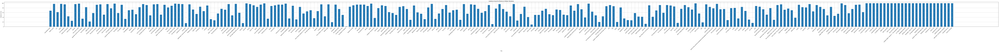

In [ ]:
import matplotlib.pyplot as plt


df = pd.read_csv('/content/combined_file.csv')

plt.figure(figsize=(200, 5))
plt.bar(df['title'], df['tomatometer'], width = 0.6)
plt.xlabel('Title')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Audience Score')
plt.title('Audience Score for Movies on Rotten Tomatoes')
plt.grid(True)
plt.show()


### Degree Distribution of Movie Ratings in Tomatometer Dataset

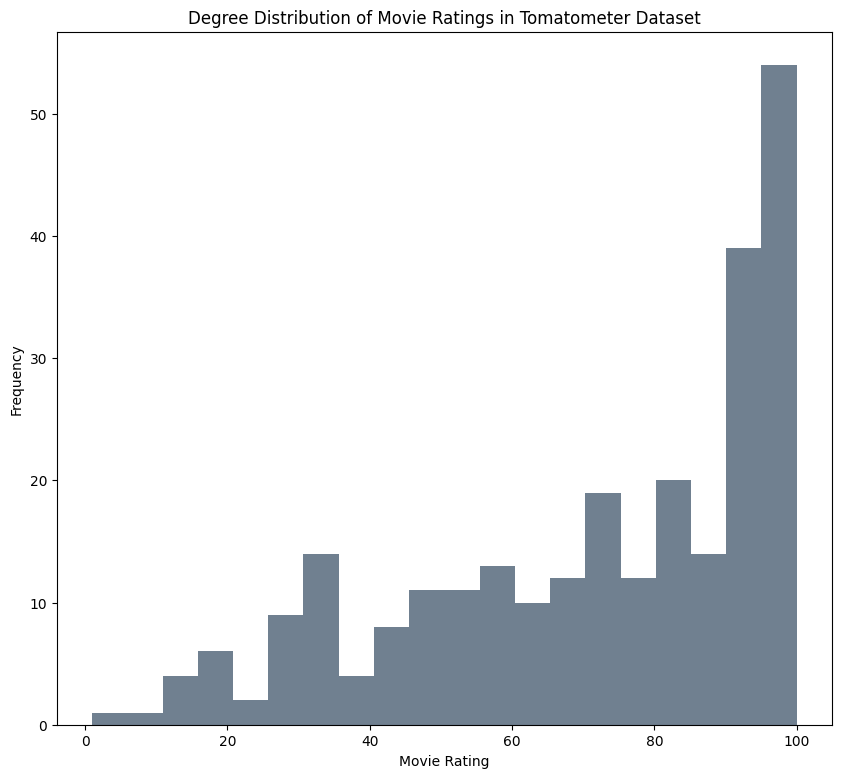

In [52]:
import pandas as pd
import matplotlib.pyplot as plt

file_csv = pd.read_csv('/content/combined_file.csv')
plt.figure(figsize=(10, 9))
plt.title('Degree Distribution of Movie Ratings in Tomatometer Dataset')
plt.ylabel('Frequency')
plt.xlabel('Movie Rating')
plt.hist(file_csv['tomatometer'], bins=20, color='slategrey')
plt.show()

### Data Visualization

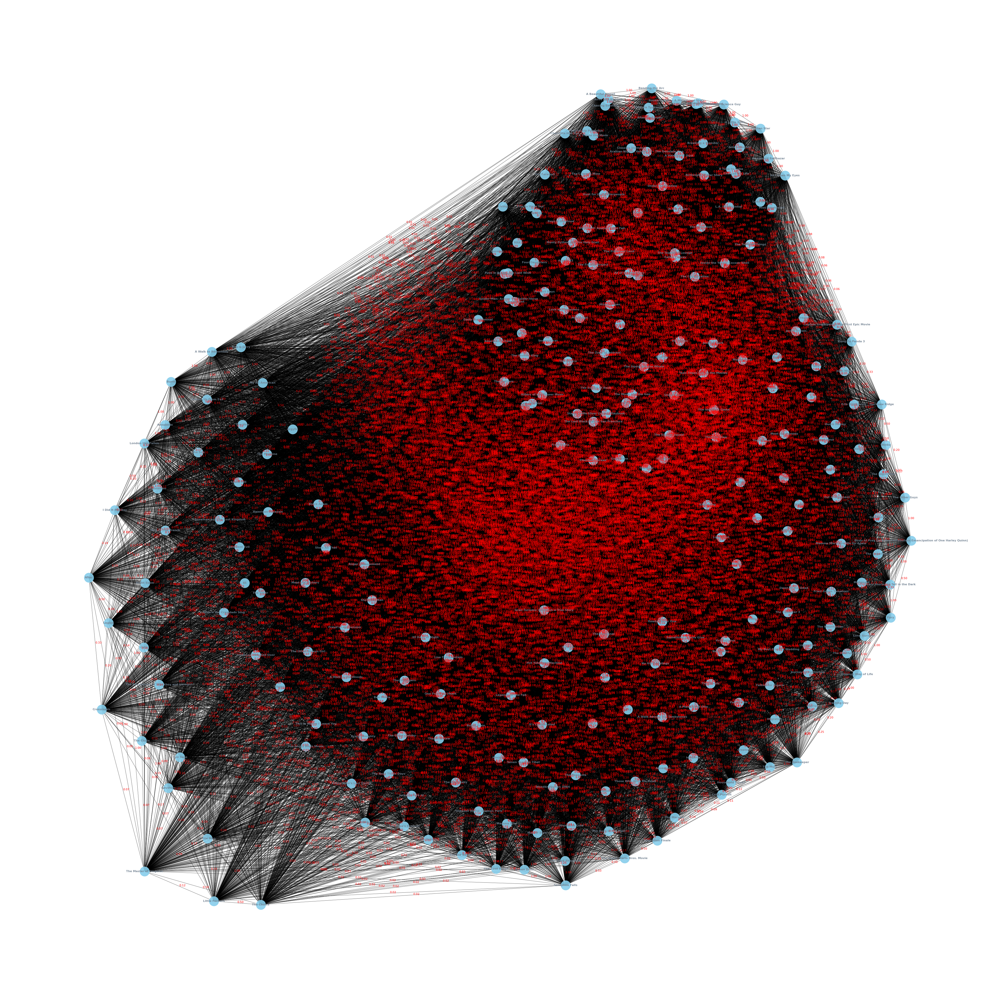

In [51]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Load movie data from CSV file
file_path = '/content/combined_file.csv'
df = pd.read_csv(file_path)

G = nx.Graph()

for index, row in df.iterrows():
    movie_name = row['title']
    tomatometer_score = row['tomatometer']
    G.add_node(movie_name, Tomatometer_score=tomatometer_score)

for movie1 in G.nodes:
    for movie2 in G.nodes:
        if movie1 != movie2 and not G.has_edge(movie1, movie2):
            score1 = G.nodes[movie1]['Tomatometer_score']
            score2 = G.nodes[movie2]['Tomatometer_score']
            if score1 - score2 == 0:
              similarity = 1 / (abs(score1 - score2) + 1)
            else:
              similarity = 1 / abs(score1 - score2)
            G.add_edge(movie1, movie2, weight=similarity, color='blue')

pos = nx.spring_layout(G, seed=42)

plt.figure(figsize=(50, 50))
#plt.figure(figsize=(250, 250))


edge_labels = nx.get_edge_attributes(G, 'weight')
for edge, weight in edge_labels.items():
    x = (pos[edge[0]][0] + pos[edge[1]][0]) / 2
    y = (pos[edge[0]][1] + pos[edge[1]][1]) / 2
    plt.text(x, y, f'{weight:.2f}', fontsize=8, color='red')


nx.draw(G, pos, with_labels=True, font_weight='bold', node_size=700, node_color='skyblue', font_size=8, font_color='slategrey', width=0.5, edge_color='black', alpha=0.9)

#plt.savefig('/Users/singhdhruv/Downloads/ntwr1.png')
#print("File Saved")
plt.show()


### Clustering Coefficient

In [ ]:
# Clustering Coefficient
clustering_coefficient = nx.average_clustering(G)

print("Average Clustering Coefficient:", clustering_coefficient)

Average Clustering Coefficient: 1.0


### Degree Distribution

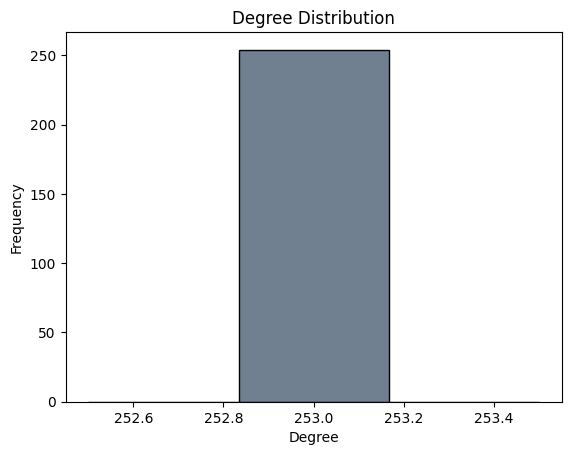

In [50]:
degrees = dict(G.degree())
degree_values = list(degrees.values())

plt.hist(degree_values, bins=3, alpha=1, color='slategrey', edgecolor='black')
plt.title('Degree Distribution')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.show()

### Page Rank

In [45]:
# Calculate PageRank
pagerank_scores = nx.pagerank(G)

# Print PageRank scores
for node, score in pagerank_scores.items():
    print(f"Node - {node}: PageRank Score = {score}")


Node - Household Saints: PageRank Score = 0.00320551999352305
Node - Fallen Leaves: PageRank Score = 0.005218707614211272
Node - I.S.S.: PageRank Score = 0.002963692470657998
Node - Tótem: PageRank Score = 0.005218707614211272
Node - Four Daughters: PageRank Score = 0.0054826306374731815
Node - Freud's Last Session: PageRank Score = 0.0028109387859202705
Node - I Did It My Way: PageRank Score = 0.002184218719351957
Node - Monster: PageRank Score = 0.005373972918116932
Node - The Crime Is Mine: PageRank Score = 0.004942481478146552
Node - Aquaman and the Lost Kingdom: PageRank Score = 0.002953248400662138
Node - Out of Darkness: PageRank Score = 0.004033131736918812
Node - Night Swim: PageRank Score = 0.0019584761571759157
Node - The Boys in the Boat: PageRank Score = 0.003383260003998257
Node - The Zone of Interest: PageRank Score = 0.005204929731890506
Node - Turning Red: PageRank Score = 0.0054826306374731815
Node - One From the Heart: PageRank Score = 0.00335102965776544
Node - How 